<center>
    <img src="https://gitlab.com/ibm/skills-network/courses/placeholder101/-/raw/master/labs/module%201/images/IDSNlogo.png" width="300" alt="cognitiveclass.ai logo"  />
</center>


# **Data Visualization Lab**


Estimated time needed: **45 to 60** minutes


In this assignment you will be focusing on the visualization of data.

The data set will be presented to you in the form of a RDBMS.

You will have to use SQL queries to extract the data.


## Objectives


In this lab you will perform the following:


*   Visualize the distribution of data.

*   Visualize the relationship between two features.

*   Visualize composition of data.

*   Visualize comparison of data.


<hr>


## Demo: How to work with database


Download database file.


In [ ]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DA0321EN-SkillsNetwork/LargeData/m4_survey_data.sqlite

Connect to the database.


In [3]:
import sqlite3
conn = sqlite3.connect("m4_survey_data.sqlite") # open a database connection

Import pandas module.


In [1]:
import pandas as pd

## Demo: How to run an sql query


In [4]:
# print how many rows are there in the table named 'master'
QUERY = """
SELECT COUNT(*)
FROM master
"""

# the read_sql_query runs the sql query and returns the data as a dataframe
df = pd.read_sql_query(QUERY,conn)
df.head()

,COUNT(*)
0,11398


## Demo: How to list all tables


In [5]:
# print all the tables names in the database
QUERY = """
SELECT name as Table_Name FROM
sqlite_master WHERE
type = 'table'
"""
# the read_sql_query runs the sql query and returns the data as a dataframe
pd.read_sql_query(QUERY,conn)


,Table_Name
0,EduOther
1,DevType
2,LastInt
3,JobFactors
4,WorkPlan
5,WorkChallenge
6,LanguageWorkedWith
7,LanguageDesireNextYear
8,DatabaseWorkedWith
9,DatabaseDesireNextYear


In [74]:
QUERY = """
SELECT DevType, count(DevType) as c1
FROM DevType
group by DevType
order by c1 DESC
"""
pd.read_sql_query(QUERY,conn)

,DevType,c1
0,"Developer, full-stack",6928
1,"Developer, back-end",6290
2,"Developer, front-end",3920
3,"Developer, desktop or enterprise applications",2575
4,"Developer, mobile",1959
5,DevOps specialist,1639
6,Database administrator,1413
7,System administrator,1202
8,Designer,988
9,"Developer, QA or test",911


## Demo: How to run a group by query


In [6]:
QUERY = """
SELECT Age,COUNT(*) as count
FROM master
group by age
order by age
"""
pd.read_sql_query(QUERY,conn)

,Age,count
0,NaN,287
1,16.0,3
2,17.0,6
3,18.0,29
4,19.0,78
5,20.0,109
6,21.0,203
7,22.0,406
8,23.0,581
9,24.0,679


## Demo: How to describe a table


In [7]:
table_name = 'master'  # the table you wish to describe

QUERY = """
SELECT sql FROM sqlite_master
WHERE name= '{}'
""".format(table_name)

df = pd.read_sql_query(QUERY,conn)
print(df.iat[0,0])

CREATE TABLE "master" (
"index" INTEGER,
  "Respondent" INTEGER,
  "MainBranch" TEXT,
  "Hobbyist" TEXT,
  "OpenSourcer" TEXT,
  "OpenSource" TEXT,
  "Employment" TEXT,
  "Country" TEXT,
  "Student" TEXT,
  "EdLevel" TEXT,
  "UndergradMajor" TEXT,
  "OrgSize" TEXT,
  "YearsCode" TEXT,
  "Age1stCode" TEXT,
  "YearsCodePro" TEXT,
  "CareerSat" TEXT,
  "JobSat" TEXT,
  "MgrIdiot" TEXT,
  "MgrMoney" TEXT,
  "MgrWant" TEXT,
  "JobSeek" TEXT,
  "LastHireDate" TEXT,
  "FizzBuzz" TEXT,
  "ResumeUpdate" TEXT,
  "CurrencySymbol" TEXT,
  "CurrencyDesc" TEXT,
  "CompTotal" REAL,
  "CompFreq" TEXT,
  "ConvertedComp" REAL,
  "WorkWeekHrs" REAL,
  "WorkRemote" TEXT,
  "WorkLoc" TEXT,
  "ImpSyn" TEXT,
  "CodeRev" TEXT,
  "CodeRevHrs" REAL,
  "UnitTests" TEXT,
  "PurchaseHow" TEXT,
  "PurchaseWhat" TEXT,
  "OpSys" TEXT,
  "BlockchainOrg" TEXT,
  "BlockchainIs" TEXT,
  "BetterLife" TEXT,
  "ITperson" TEXT,
  "OffOn" TEXT,
  "SocialMedia" TEXT,
  "Extraversion" TEXT,
  "ScreenName" TEXT,
  "SOVisit1st" T

In [77]:
QUERY = """
SELECT Employment
FROM master
"""
pd.read_sql_query(QUERY,conn)

,Employment
0,Employed full-time
1,Employed full-time
2,Employed full-time
3,Employed full-time
4,Employed full-time
...,...
11393,Employed full-time
11394,Employed full-time
11395,Employed full-time
11396,Employed full-time


# Hands-on Lab


## Visualizing distribution of data


### Histograms


Plot a histogram of `ConvertedComp.`


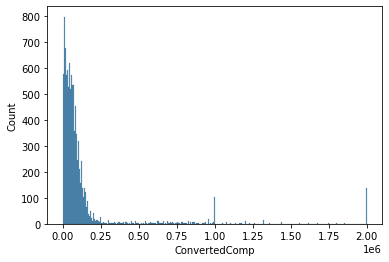

In [11]:
# your code goes here
import seaborn as sns

QUERY = """
SELECT ConvertedComp
FROM master
"""
df = pd.read_sql_query(QUERY,conn)
ax = sns.histplot(df['ConvertedComp'])

### Box Plots


Plot a box plot of `Age.`


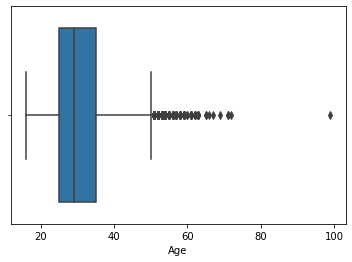

In [12]:
# your code goes here
QUERY = """
SELECT Age
FROM master
"""
df_Age = pd.read_sql_query(QUERY, conn)
ax = sns.boxplot(x=df_Age['Age'])

## Visualizing relationships in data


### Scatter Plots


Create a scatter plot of `Age` and `WorkWeekHrs.`


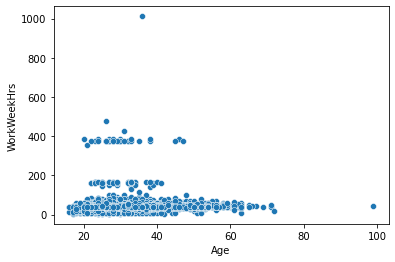

In [13]:
# your code goes here
QUERY = """
SELECT Age, WorkWeekHrs
FROM master
"""
df = pd.read_sql_query(QUERY, conn)
ax = sns.scatterplot(data=df, x='Age', y='WorkWeekHrs')

### Bubble Plots


Create a bubble plot of `WorkWeekHrs` and `CodeRevHrs`, use `Age` column as bubble size.


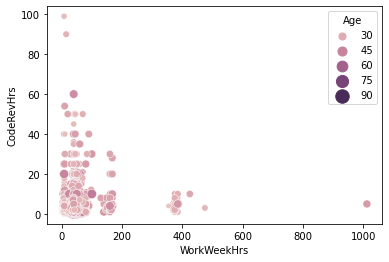

In [21]:
# your code goes here
QUERY = """
SELECT Age, WorkWeekHrs, CodeRevHrs
FROM master
"""
df = pd.read_sql_query(QUERY, conn)
ax = sns.scatterplot(data=df, x='WorkWeekHrs', y='CodeRevHrs', size='Age', hue='Age', sizes=(20,200))

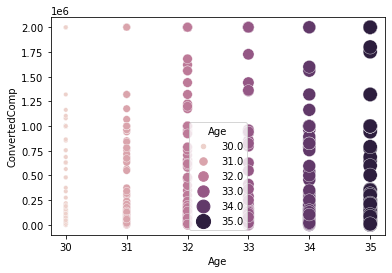

In [76]:
QUERY = """
SELECT Age, ConvertedComp
FROM master
WHERE Age >= 30 AND Age <= 35
"""
df = pd.read_sql_query(QUERY, conn)
ax = sns.scatterplot(data=df, x='Age', y='ConvertedComp', size='Age', hue='Age', sizes=(20,200))

## Visualizing composition of data


### Pie Charts


Create a pie chart of the top 5 databases that respondents wish to learn next year. Label the pie chart with database names. Display percentages of each database on the pie chart.


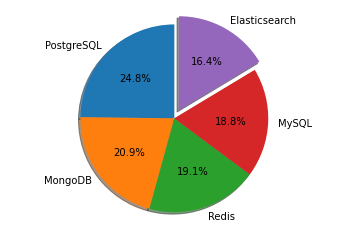

In [34]:
# your code goes here
import matplotlib.pyplot as plt
%matplotlib inline

QUERY = """
SELECT DatabaseDesireNextYear, count(*) as c1
FROM DataBaseDesireNextYear
group by DatabaseDesireNextYear
order by c1 DESC
"""
df = pd.read_sql_query(QUERY, conn)

# Create the chart
labels = df['DatabaseDesireNextYear'].head(5)
sizes = df['c1'].head(5)
explode = (0,0,0,0,0.1)
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')  # equal so pie will be drawn as circle

plt.show()

In [57]:
QUERY = """
SELECT LanguageDesireNextYear, count(*) as c1
FROM LanguageDesireNextYear
group by LanguageDesireNextYear
order by c1 DESC
"""
df = pd.read_sql_query(QUERY, conn)
df.head()

,LanguageDesireNextYear,c1
0,JavaScript,6630
1,HTML/CSS,5328
2,Python,5239
3,SQL,5012
4,TypeScript,4088


In [58]:
QUERY = """
SELECT LanguageWorkedWith, count(*) as c1
FROM LanguageWorkedWith
group by LanguageWorkedWith
order by c1 DESC
"""
df = pd.read_sql_query(QUERY, conn)
df.head()

,LanguageWorkedWith,c1
0,JavaScript,8687
1,HTML/CSS,7830
2,SQL,7106
3,Bash/Shell/PowerShell,4642
4,Python,4542


In [69]:
QUERY = """
SELECT *
FROM DatabaseWorkedWith
order by Respondent
"""
df = pd.read_sql_query(QUERY, conn)
df.head()

df2 = df.groupby(['Respondent']).sum()
df2[df2['DatabaseWorkedWith']=='MySQL'].count()

DatabaseWorkedWith    474
dtype: int64

### Stacked Charts


Create a stacked chart of median `WorkWeekHrs` and `CodeRevHrs` for the age group 30 to 35.


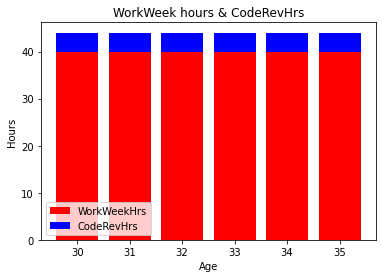

In [47]:
# your code goes here
import matplotlib.pyplot as plt
%matplotlib inline

QUERY = """
SELECT WorkWeekHrs, CodeRevHrs, Age
FROM master
WHERE age <= 35 AND age >= 30
order by age
"""

df = pd.read_sql_query(QUERY, conn)

l1 = [30,31,32,33,34,35]
l2 = []
l3 = []

for i in l1:
    l2.append(df[df['Age']==i]['WorkWeekHrs'].median())
    l3.append(df[df['Age']==i]['CodeRevHrs'].median())

# Chart
labels = l1
y1 = l2
y2 = l3

plt.bar(labels, y1, color='r')
plt.bar(labels, y2, bottom=y1, color='b')
plt.legend(['WorkWeekHrs', 'CodeRevHrs'])
plt.xlabel('Age')
plt.ylabel('Hours')
plt.title('WorkWeek hours & CodeRevHrs')
plt.show()

## Visualizing comparison of data


### Line Chart


Plot the median `ConvertedComp` for all ages from 45 to 60.


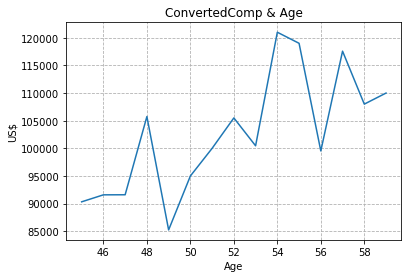

In [52]:
# your code goes here
import matplotlib.pyplot as plt
%matplotlib inline

QUERY = """
SELECT ConvertedComp, Age
FROM master
WHERE age <= 60 AND age >= 45
order by age
"""

df = pd.read_sql_query(QUERY, conn)

l1 = range(45, 60)
l2 = []

for i in l1:
    l2.append(df[df['Age']==i]['ConvertedComp'].median())

# Line chart
plt.figure()
plt.plot(l1, l2)

plt.xlabel('Age')
plt.ylabel('US$')
plt.title('ConvertedComp & Age')
plt.grid(True, linestyle='--')

plt.show()

### Bar Chart


Create a horizontal bar chart using column `MainBranch.`


In [54]:
# your code goes here
import matplotlib.pyplot as plt
%matplotlib inline

QUERY = """
SELECT MainBranch
FROM master
group by MainBranch
"""

df = pd.read_sql_query(QUERY, conn)
df.head()

,MainBranch
0,I am a developer by profession
1,"I am not primarily a developer, but I write co..."


Close the database connection.


In [ ]:
conn.close()

## Authors


Ramesh Sannareddy


### Other Contributors


Rav Ahuja


## Change Log


| Date (YYYY-MM-DD) | Version | Changed By        | Change Description                 |
| ----------------- | ------- | ----------------- | ---------------------------------- |
| 2020-10-17        | 0.1     | Ramesh Sannareddy | Created initial version of the lab |


Copyright © 2020 IBM Corporation. This notebook and its source code are released under the terms of the [MIT License](https://cognitiveclass.ai/mit-license?utm_medium=Exinfluencer\&utm_source=Exinfluencer\&utm_content=000026UJ\&utm_term=10006555\&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDA0321ENSkillsNetwork21426264-2021-01-01\&cm_mmc=Email_Newsletter-\_-Developer_Ed%2BTech-\_-WW_WW-\_-SkillsNetwork-Courses-IBM-DA0321EN-SkillsNetwork-21426264\&cm_mmca1=000026UJ\&cm_mmca2=10006555\&cm_mmca3=M12345678\&cvosrc=email.Newsletter.M12345678\&cvo_campaign=000026UJ).
